In [1]:
cd F:\PROJECTS\PROJECT_HUMAN_FETAL_COCHLEAE\WORKPLACE\R\sc_pipeline\

F:\PROJECTS\PROJECT_HUMAN_FETAL_COCHLEAE\WORKPLACE\R\sc_pipeline


G:\Miniconda3\envs\omicverse\lib\site-packages\IPython\core\magics\osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import os
import sys
import scipy
import matplotlib
from matplotlib import rcParams
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all" # to show output from all the lines in a cells
pd.set_option('display.max_column',None) # display all the columns in pandas
pd.options.display.max_rows = 100
rcParams['pdf.fonttype'] = 42
sc.settings.figdir = './figures/disease_map_analysis/'
sc.settings.set_figure_params(dpi = 150, color_map = 'RdPu', dpi_save = 600, vector_friendly = True, format = 'pdf')

In [3]:
data_dir = '/PROJECTS/PROJECT_HUMAN_FETAL_COCHLEAE/WORKPLACE/R/sc_pipeline/'

In [4]:
data_dir = '/PROJECTS/PROJECT_HUMAN_FETAL_COCHLEAE/WORKPLACE/R/sc_pipeline/'
meta = pd.read_csv(data_dir+'sample_metadata.csv',index_col=0)
meta

,sample_id,donor,gestation week (gw),gender,10xKit,sequencing,dataset,donor information,GSE ARCHIVE
sample,,,,,,,,,
9.5gw,gw9,not_provided_1,9,female,SC3,snRNA-seq,public,healthy,GSE213796
11.2gw,gw11,not_provided_2,11,male,SC3,snRNA-seq,public,healthy,GSE213796
14+3gw,gw14,F20240701,14,male,SC3,snRNA-seq,in-house,healthy,NaN
15gw,gw15,not_provided_3,15,female,SC3,scRNA-seq,public,not_provided,GSE135913
16+4gw,gw16,F20241018,16,male,SC3,snRNA-seq,in-house,healthy,NaN
17+2gw,gw17_1,F20220807,17,male,SC3,snRNA-seq,in-house,healthy,NaN
17+3gw,gw17_2,F20240928,17,female,SC3,snRNA-seq,in-house,healthy,NaN
17gw,gw17_3,not_provided_4,17,male,SC3,scRNA-seq,public,not_provided,GSE135913
18+3gw,gw18,F20220806,18,male,SC3,snRNA-seq,in-house,healthy,NaN


In [5]:
adata = sc.read(data_dir + 'human_cochlea_annotation.h5ad')

In [6]:
meta['sample'] = meta['sample_id'].astype('str')
plotmeta = list(meta.columns)
plotmeta.append('sample')
print('Number of sample: ', meta.index.size)
meta

Number of sample:  15


,sample_id,donor,gestation week (gw),gender,10xKit,sequencing,dataset,donor information,GSE ARCHIVE,sample
sample,,,,,,,,,,
9.5gw,gw9,not_provided_1,9,female,SC3,snRNA-seq,public,healthy,GSE213796,gw9
11.2gw,gw11,not_provided_2,11,male,SC3,snRNA-seq,public,healthy,GSE213796,gw11
14+3gw,gw14,F20240701,14,male,SC3,snRNA-seq,in-house,healthy,NaN,gw14
15gw,gw15,not_provided_3,15,female,SC3,scRNA-seq,public,not_provided,GSE135913,gw15
16+4gw,gw16,F20241018,16,male,SC3,snRNA-seq,in-house,healthy,NaN,gw16
17+2gw,gw17_1,F20220807,17,male,SC3,snRNA-seq,in-house,healthy,NaN,gw17_1
17+3gw,gw17_2,F20240928,17,female,SC3,snRNA-seq,in-house,healthy,NaN,gw17_2
17gw,gw17_3,not_provided_4,17,male,SC3,scRNA-seq,public,not_provided,GSE135913,gw17_3
18+3gw,gw18,F20220806,18,male,SC3,snRNA-seq,in-house,healthy,NaN,gw18


In [7]:
holder = []
for sample in meta.index:
    print(sample)
    # Load 10x data as AnnData
    #adata_sample = sc.read_10x_mtx(data_dir+'rawdata_pbx3_neo/'+sample+'/outs/filtered_feature_bc_matrix/',cache=True)
    holder.append(sc.read(data_dir+sample+'/human_gw_raw.h5ad',cache=True)) 
    # Set names of observation as sample + _ + barcode/probe
    holder[-1].obs_names = [sample+'_'+i.split('-')[0] for i in holder[-1].obs_names]
    # Filer genes expressed in less than 3 cells
    sc.pp.filter_genes(holder[-1], min_cells=3)
    # Filer cells with less than 10 genes expressed
    sc.pp.filter_cells(holder[-1], min_genes=10)
    # add in metadata
    holder[-1].obs['sample'] = sample
    for val in meta.columns:
        holder[-1].obs[val] = meta[val][sample]
    # Extract mitochondial genes
    mito_genes = [name for name in holder[-1].var_names if name.startswith('MT-')]
    #for each cell compute fraction of counts in mito genes vs. all genes
    #the `.A1` is only necessary, as X is sparse - it transform to a dense array after summing
    holder[-1].obs['percent_mito'] = np.sum(
        holder[-1][:, mito_genes].X, axis=1).A1 / np.sum(holder[-1].X, axis=1).A1
    #add the total counts per cell as observations-annotation to adata
    holder[-1].obs['n_counts'] = holder[-1].X.sum(axis=1).A1
    print('Total number of cells: {:d}'.format(holder[-1].n_obs))
    print('Total number of genes: {:d}'.format(holder[-1].n_vars))

9.5gw
Total number of cells: 4284
Total number of genes: 22512
11.2gw
Total number of cells: 4051
Total number of genes: 26703
14+3gw
Total number of cells: 12081
Total number of genes: 29961
15gw
Total number of cells: 2146
Total number of genes: 18995
16+4gw
Total number of cells: 8708
Total number of genes: 29950
17+2gw
Total number of cells: 6773
Total number of genes: 26118
17+3gw
Total number of cells: 7148
Total number of genes: 26633
17gw
Total number of cells: 4538
Total number of genes: 19729
18+3gw
Total number of cells: 9595
Total number of genes: 26884
20gw
Total number of cells: 3833
Total number of genes: 26808
22+2gw_1
Total number of cells: 5837
Total number of genes: 28742
22+2gw_2
Total number of cells: 7861
Total number of genes: 26226
23+2gw
Total number of cells: 3597
Total number of genes: 24258
25+6gw
Total number of cells: 13936
Total number of genes: 28576
26+3gw
Total number of cells: 7872
Total number of genes: 25874


In [8]:
# confirm N samples
print(len(holder))
# merge datasets
adata_all = holder[0].concatenate(holder[1:],join='outer',index_unique=None)
# copy of this matrix in Compressed Sparse Row format
adata_all.X = adata_all.X.tocsr()
adata_all

15


C:\Users\Dell\AppData\Local\Temp\ipykernel_34716\3203741929.py:4: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata_all = holder[0].concatenate(holder[1:],join='outer',index_unique=None)


AnnData object with n_obs × n_vars = 102260 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'donor', 'gestation week (gw)', 'gender', '10xKit', 'sequencing', 'dataset', 'donor information', 'GSE ARCHIVE', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA'
    var: 'gene_ids-0', 'feature_types-0', 'Gene-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'Gene-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'n_cells-1', 'gene_ids-10', 'feature_types-10', 'Gene-10', 'n_cells_by_counts-10', 'mean_counts-10', 'pct_dropout_by_counts-10', 'total_counts-10', 'highly_variable-10', 'means-10', 'disper

In [9]:
# Method 1: Using index intersection (safer)
common_indices = adata_all.obs.index.intersection(adata.obs.index)
adata_new = adata_all[common_indices, :].copy()

# Method 2: Direct indexing (faster but may raise error if indices don't match exactly)
# adata_subset = adata[adata_all.obs.index, :].copy()

In [10]:
adata_new

AnnData object with n_obs × n_vars = 82533 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'donor', 'gestation week (gw)', 'gender', '10xKit', 'sequencing', 'dataset', 'donor information', 'GSE ARCHIVE', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA'
    var: 'gene_ids-0', 'feature_types-0', 'Gene-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'Gene-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'n_cells-1', 'gene_ids-10', 'feature_types-10', 'Gene-10', 'n_cells_by_counts-10', 'mean_counts-10', 'pct_dropout_by_counts-10', 'total_counts-10', 'highly_variable-10', 'means-10', 'dispers

In [11]:
# Normalizing to median total counts
sc.pp.normalize_total(adata_new)
# Logarithmize the data
sc.pp.log1p(adata_new)

In [12]:
#subset gw9,11,14 as adata1; gw15,16,17,18,20 as adata2; gw22,23,25,26 as adata3
adata1=adata_new[adata_new.obs['sample_id'].isin(["gw9","gw11",])]
adata2=adata_new[adata_new.obs['sample_id'].isin(["gw14","gw15","gw16","gw17_1","gw17_2","gw17_3","gw18",])]
adata3=adata_new[adata_new.obs['sample_id'].isin(["gw20","gw22_1","gw22_2","gw23","gw25","gw26",])]
adata1
adata2
adata3

View of AnnData object with n_obs × n_vars = 7123 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'donor', 'gestation week (gw)', 'gender', '10xKit', 'sequencing', 'dataset', 'donor information', 'GSE ARCHIVE', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA'
    var: 'gene_ids-0', 'feature_types-0', 'Gene-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'Gene-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'n_cells-1', 'gene_ids-10', 'feature_types-10', 'Gene-10', 'n_cells_by_counts-10', 'mean_counts-10', 'pct_dropout_by_counts-10', 'total_counts-10', 'highly_variable-10', 'means-10', '

View of AnnData object with n_obs × n_vars = 40075 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'donor', 'gestation week (gw)', 'gender', '10xKit', 'sequencing', 'dataset', 'donor information', 'GSE ARCHIVE', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA'
    var: 'gene_ids-0', 'feature_types-0', 'Gene-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'Gene-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'n_cells-1', 'gene_ids-10', 'feature_types-10', 'Gene-10', 'n_cells_by_counts-10', 'mean_counts-10', 'pct_dropout_by_counts-10', 'total_counts-10', 'highly_variable-10', 'means-10', 

View of AnnData object with n_obs × n_vars = 35335 × 46922
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'donor', 'gestation week (gw)', 'gender', '10xKit', 'sequencing', 'dataset', 'donor information', 'GSE ARCHIVE', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA'
    var: 'gene_ids-0', 'feature_types-0', 'Gene-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'Gene-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'n_cells-1', 'gene_ids-10', 'feature_types-10', 'Gene-10', 'n_cells_by_counts-10', 'mean_counts-10', 'pct_dropout_by_counts-10', 'total_counts-10', 'highly_variable-10', 'means-10', 

In [13]:
# 检查前5行前5列的数据
print(adata3.X[:15, :15].toarray())  # 如果是稀疏矩阵

[[0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.        ]
 [0.         0.         0.         0.40219089 0.         0.
  0.         0.         0.         0.         0.         0.
  0.40219089 0.         0.        ]
 [0.         0.         0.         1.09821767 0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.        ]
 [0.         0.         0.         0.         0.         0.
  0.

In [14]:
# Normalizing to median total counts
adata1.X = adata1.layers["counts"].copy()
adata2.X = adata2.layers["counts"].copy()
adata3.X = adata3.layers["counts"].copy()
sc.pp.filter_genes(adata1,min_cells=3)
sc.pp.filter_genes(adata2,min_cells=3)
sc.pp.filter_genes(adata3,min_cells=3)
sc.pp.normalize_total(adata1)
# Logarithmize the data
sc.pp.log1p(adata1)

sc.pp.normalize_total(adata2)
# Logarithmize the data
sc.pp.log1p(adata2)

sc.pp.normalize_total(adata3)
# Logarithmize the data
sc.pp.log1p(adata3)

G:\Miniconda3\envs\omicverse\lib\site-packages\scanpy\preprocessing\_simple.py:287: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var["n_cells"] = number
G:\Miniconda3\envs\omicverse\lib\site-packages\scanpy\preprocessing\_simple.py:287: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var["n_cells"] = number
G:\Miniconda3\envs\omicverse\lib\site-packages\scanpy\preprocessing\_simple.py:287: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var["n_cells"] = number


In [15]:
adata1.layers["scaled"]=sc.pp.scale(adata1.X,max_value=5,copy=True)
adata2.layers["scaled"]=sc.pp.scale(adata2.X,max_value=5,copy=True)
adata3.layers["scaled"]=sc.pp.scale(adata3.X,max_value=5,copy=True)

In [16]:
#genes related nonsyndromic SNHL in hair cells
markers = ['ATP2B2','CABP2','CDC14A','CDH23','DIABLO','DMXL2','EPS8','EPS8L2','ESPN','GRXCR1','GRXCR2','HOMER2','KCNQ4',
           'LOXHD1','MYO15A','MYO3A','MYO6','MYO7A','OSBPL2','OTOF','PCDH15','PDE1C','PDZD7','PLS1','POU4F3','PRPS1',
           'PTPRQ','RDX','SIX1','SERPINB6','SLC17A8','SLC26A5','STRC','SYNE4','TBC1D24','TNC','USH1C'

          ]#'PJVK', 'RIPOR2', 'WHRN','CLRN2'

In [17]:
adata1.obs['cell_type'].value_counts()

cell_type
CCs                            1049
SGNs                            862
CoE_Lateral                     743
Chondrocytes                    666
Vestibular_Epithelial_cells     532
Vestibular_SCs                  530
GCs                             503
Mesenchymal                     491
CoE_Medial                      476
Vestibular_Roof_cells           284
CoE_prosensory                  253
CoE_Roof_cells                  215
Endothelial                     172
Vestibular_Dark_cells           157
Macrophages                      71
Vestibular_HCs                   57
VGNs                             31
Melanocytes                      31
Name: count, dtype: int64

In [18]:
adata_vestibu=adata1[adata1.obs['cell_type'].isin(["Vestibular_Epithelial_cells","Vestibular_SCs","Vestibular_Roof_cells",
                                                   "Vestibular_Dark_cells","Vestibular_HCs",
                                                                                  "VGNs",
                                                                            ])]

In [19]:

exclude_clusters = ["Vestibular_Epithelial_cells","Vestibular_SCs","Vestibular_Roof_cells",
                                                   "Vestibular_Dark_cells","Vestibular_HCs",
                                                                                  "VGNs",]
adata1= adata1[~adata1.obs['cell_type'].isin(exclude_clusters), :]
adata1

View of AnnData object with n_obs × n_vars = 5532 × 26870
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'donor', 'gestation week (gw)', 'gender', '10xKit', 'sequencing', 'dataset', 'donor information', 'GSE ARCHIVE', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA'
    var: 'gene_ids-0', 'feature_types-0', 'Gene-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'Gene-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'n_cells-1', 'gene_ids-10', 'feature_types-10', 'Gene-10', 'n_cells_by_counts-10', 'mean_counts-10', 'pct_dropout_by_counts-10', 'total_counts-10', 'highly_variable-10', 'means-10', '

G:\Miniconda3\envs\omicverse\lib\site-packages\anndata\_core\anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
G:\Miniconda3\envs\omicverse\lib\site-packages\anndata\_core\anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
G:\Miniconda3\envs\omicverse\lib\site-packages\anndata\_core\anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
G:\Miniconda3\envs\omicverse\lib\site-packages\anndata\_core\anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
G:\Miniconda3\envs\omicverse\lib\site-packages\anndata\_core\anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
G:\Miniconda3\envs\omicverse\lib\si

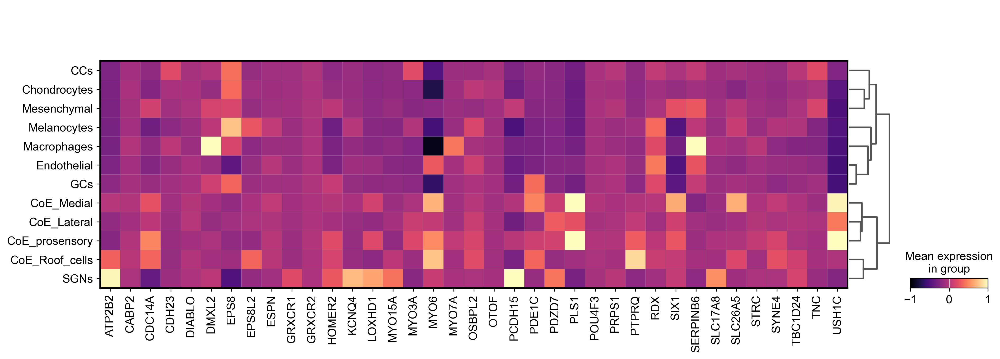

In [20]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
#sc.tl.dendrogram(adata1,groupby='cell_type')
gs = sc.pl.matrixplot(adata1, markers, groupby='cell_type',layer="scaled",dendrogram=True,vmin=-1,cmap="magma",vmax=1,
   save="nonsyndromic_HAIR_CELL_human_adata1.pdf"
                     )

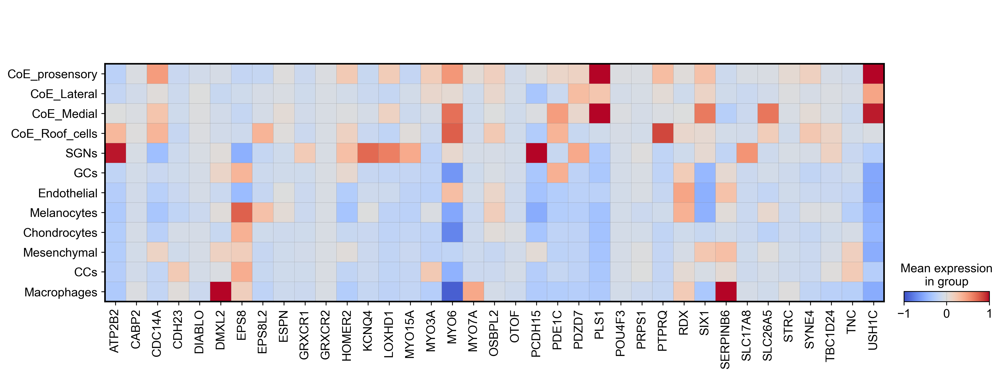

In [21]:
# Set the desired order of cell types
custom_order = [ 'CoE_prosensory', 'CoE_Lateral','CoE_Medial','CoE_Roof_cells',
               'SGNs','GCs','Endothelial',
               'Melanocytes','Chondrocytes','Mesenchymal','CCs','Macrophages']

# Filter the adata1 object to only include these cell types (optional)
adata_subset1 = adata1[adata1.obs['cell_type'].isin(custom_order)].copy()

# Set the cell_type column as categorical with the desired order
adata_subset1.obs['cell_type'] = pd.Categorical(
    adata_subset1.obs['cell_type'],
    categories=custom_order,
    ordered=True
)

# Set figure parameters
sc.set_figure_params(figsize=(4,4), frameon=False, dpi=150, dpi_save=600)

# Create matrixplot with the subset and ordered categories
gs = sc.pl.matrixplot(
    adata_subset1, 
    markers, 
    groupby='cell_type',
    layer="scaled",
    dendrogram=False,  # Disable dendrogram since we're using custom order
    vmin=-1,
    cmap="coolwarm",
    vmax=1,
    save="nonsyndromic_HAIR_CELL_human_adata1_ordered.pdf"
)

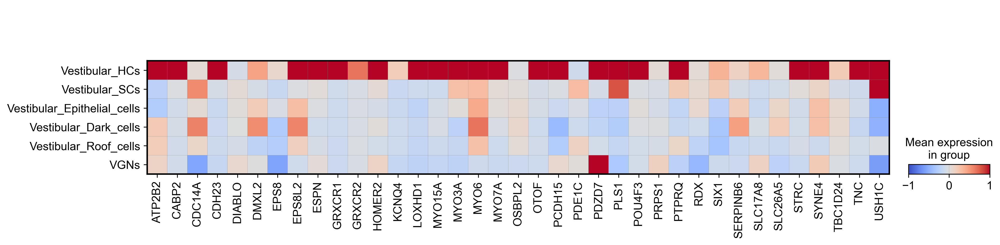

In [22]:
# Set the desired order of cell types
custom_order = ['Vestibular_HCs','Vestibular_SCs',
               'Vestibular_Epithelial_cells','Vestibular_Dark_cells','Vestibular_Roof_cells','VGNs',
              ]

# Filter the adata1 object to only include these cell types (optional)
adata_vestibu1 = adata_vestibu[adata_vestibu.obs['cell_type'].isin(custom_order)].copy()

# Set the cell_type column as categorical with the desired order
adata_vestibu1.obs['cell_type'] = pd.Categorical(
    adata_vestibu1.obs['cell_type'],
    categories=custom_order,
    ordered=True
)

# Set figure parameters
sc.set_figure_params(figsize=(4,4), frameon=False, dpi=150, dpi_save=600)

# Create matrixplot with the subset and ordered categories
gs = sc.pl.matrixplot(
    adata_vestibu1, 
    markers, 
    groupby='cell_type',
    layer="scaled",
    dendrogram=False,  # Disable dendrogram since we're using custom order
    vmin=-1,
    cmap="coolwarm",
    vmax=1,
    save="nonsyndromic_HAIR_CELL_human_adata1_vestibu_ordered.pdf"
)

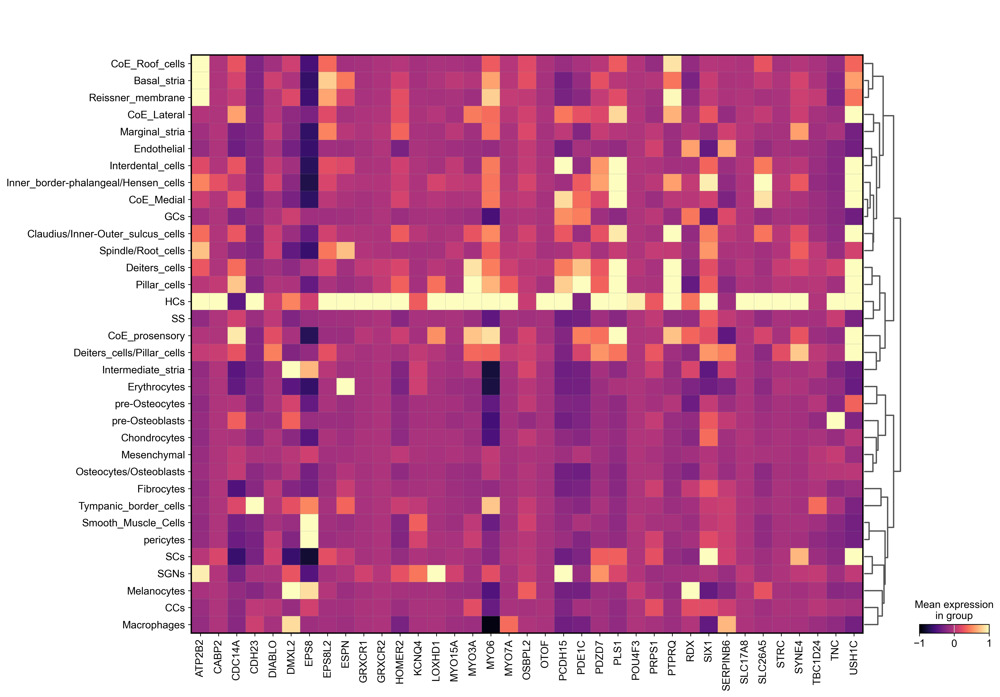

In [23]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
#sc.tl.dendrogram(adata1,groupby='cell_type')
gs = sc.pl.matrixplot(adata2, markers, groupby='cell_type',layer="scaled",dendrogram=True,vmin=-1,cmap="magma",vmax=1,
   save="nonsyndromic_HAIR_CELL_human_adata2.pdf"
                     )

In [24]:
exclude_clusters = ['SCs','Deiters_cells/Pillar_cells',]
adata2= adata2[~adata2.obs['cell_type'].isin(exclude_clusters), :]
adata2

View of AnnData object with n_obs × n_vars = 39859 × 42901
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'donor', 'gestation week (gw)', 'gender', '10xKit', 'sequencing', 'dataset', 'donor information', 'GSE ARCHIVE', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA'
    var: 'gene_ids-0', 'feature_types-0', 'Gene-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'Gene-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'n_cells-1', 'gene_ids-10', 'feature_types-10', 'Gene-10', 'n_cells_by_counts-10', 'mean_counts-10', 'pct_dropout_by_counts-10', 'total_counts-10', 'highly_variable-10', 'means-10', 

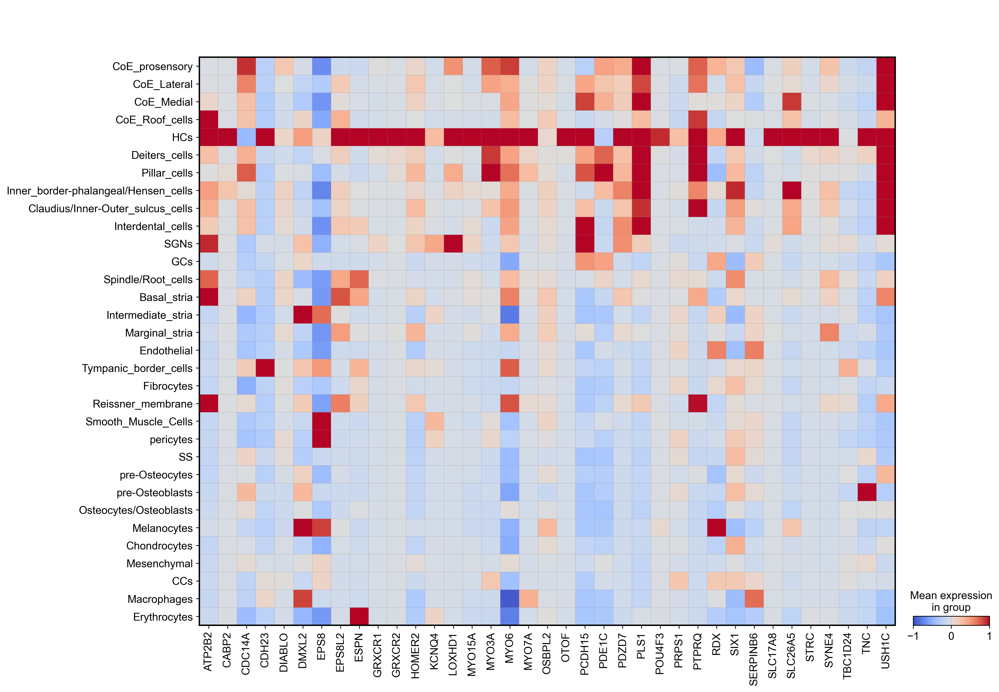

In [25]:
# Set the desired order of cell types
custom_order = ['CoE_prosensory', 'CoE_Lateral','CoE_Medial','CoE_Roof_cells',
    'HCs','Deiters_cells', 'Pillar_cells', 'Inner_border-phalangeal/Hensen_cells','Claudius/Inner-Outer_sulcus_cells',
                'Interdental_cells',   'SGNs',
               'GCs','Spindle/Root_cells','Basal_stria','Intermediate_stria','Marginal_stria','Endothelial',
                'Tympanic_border_cells','Fibrocytes',
               'Reissner_membrane','Smooth_Muscle_Cells','pericytes','SS','pre-Osteocytes','pre-Osteoblasts','Osteocytes/Osteoblasts',
                'Melanocytes',
                'Chondrocytes','Mesenchymal',
                'CCs','Macrophages','Erythrocytes']

# Filter the adata1 object to only include these cell types (optional)
adata_subset2 = adata2[adata2.obs['cell_type'].isin(custom_order)].copy()

# Set the cell_type column as categorical with the desired order
adata_subset2.obs['cell_type'] = pd.Categorical(
    adata_subset2.obs['cell_type'],
    categories=custom_order,
    ordered=True
)

# Set figure parameters
sc.set_figure_params(figsize=(4,4), frameon=False, dpi=150, dpi_save=600)

# Create matrixplot with the subset and ordered categories
gs = sc.pl.matrixplot(
    adata_subset2, 
    markers, 
    groupby='cell_type',
    layer="scaled",
    dendrogram=False,  # Disable dendrogram since we're using custom order
    vmin=-1,
    cmap="coolwarm",
    vmax=1,
    save="nonsyndromic_HAIR_CELL_human_adata2_ordered.pdf"
)

In [26]:
adata3.obs['cell_type'].value_counts()

cell_type
Endothelial                             5025
Tympanic_border_cells                   5015
GCs                                     3823
Osteocytes                              3710
Intermediate_stria                      2881
Fibrocytes                              2794
Osteoblasts                             1760
Chondrocytes                            1538
Claudius/Inner-Outer_sulcus_cells       1167
Macrophages                              785
Mesenchymal                              694
pre-Osteoblasts                          660
SGNs                                     618
SS                                       595
Deiters_cells                            499
Marginal_stria                           484
CCs                                      473
Osteocytes/Osteoblasts                   391
Interdental_cells                        353
Inner_border-phalangeal/Hensen_cells     344
Pillar_cells                             266
Smooth_Muscle_Cells                      257


In [27]:
exclude_clusters = ['Basal_stria/Spindle/Root_cells','SCs','Osteocytes/Osteoblasts']
adata3= adata3[~adata3.obs['cell_type'].isin(exclude_clusters), :]
adata3

View of AnnData object with n_obs × n_vars = 34776 × 38935
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'donor', 'gestation week (gw)', 'gender', '10xKit', 'sequencing', 'dataset', 'donor information', 'GSE ARCHIVE', 'percent_mito', 'n_counts', 'nCount_RNA', 'nFeature_RNA'
    var: 'gene_ids-0', 'feature_types-0', 'Gene-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'Gene-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'n_cells-1', 'gene_ids-10', 'feature_types-10', 'Gene-10', 'n_cells_by_counts-10', 'mean_counts-10', 'pct_dropout_by_counts-10', 'total_counts-10', 'highly_variable-10', 'means-10', 

G:\Miniconda3\envs\omicverse\lib\site-packages\anndata\_core\anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
G:\Miniconda3\envs\omicverse\lib\site-packages\anndata\_core\anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
G:\Miniconda3\envs\omicverse\lib\site-packages\anndata\_core\anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
G:\Miniconda3\envs\omicverse\lib\site-packages\anndata\_core\anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
G:\Miniconda3\envs\omicverse\lib\site-packages\anndata\_core\anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
G:\Miniconda3\envs\omicverse\lib\si

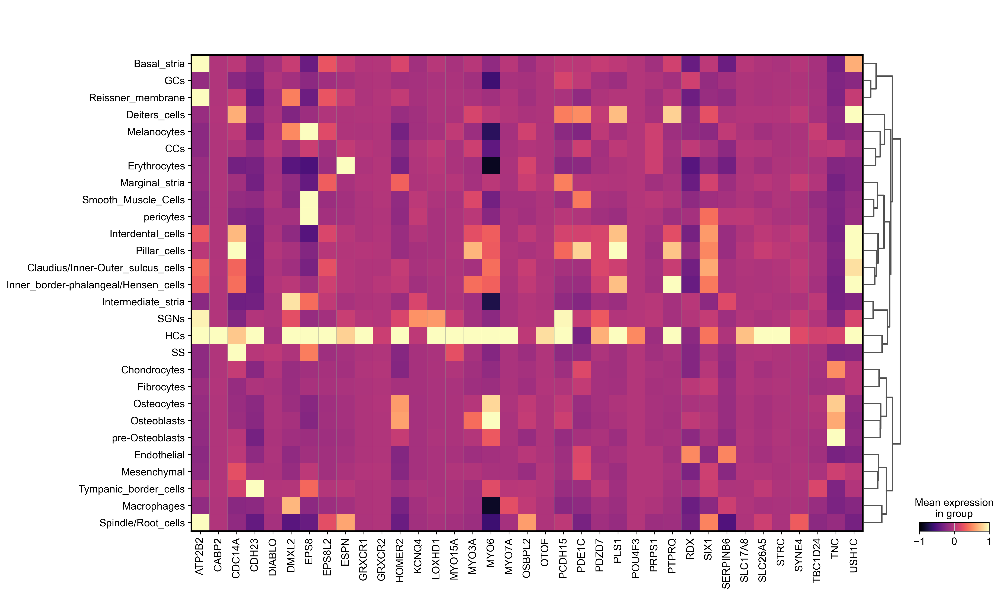

In [28]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
#sc.tl.dendrogram(adata1,groupby='cell_type')
gs = sc.pl.matrixplot(adata3, markers, groupby='cell_type',layer="scaled",dendrogram=True,vmin=-1,cmap="magma",vmax=1,
   save="nonsyndromic_HAIR_CELL_human_adata3.pdf"
                     )

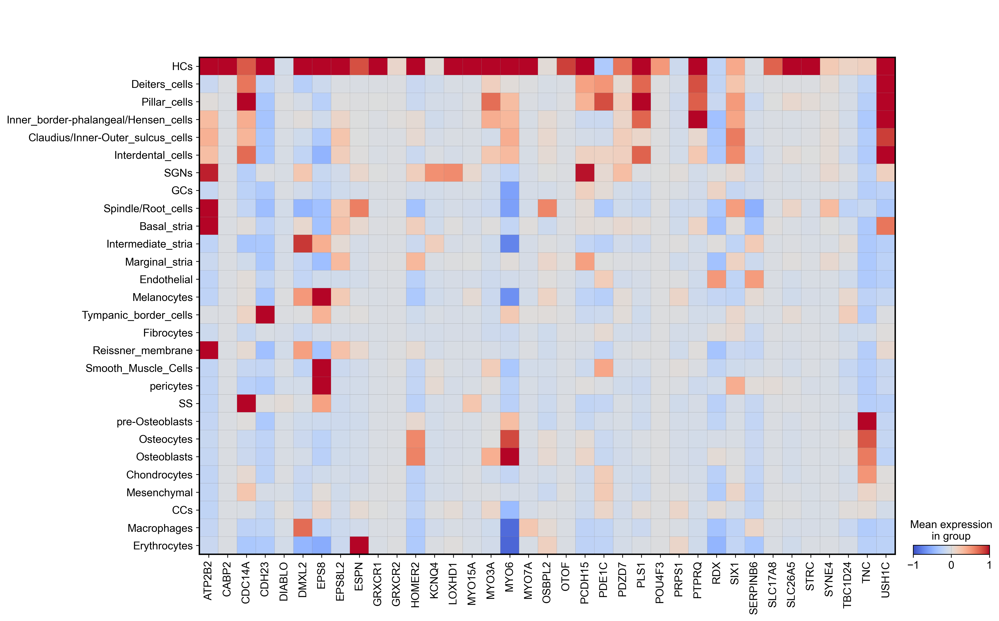

In [29]:
# Set the desired order of cell types
custom_order = ['HCs','Deiters_cells', 'Pillar_cells', 'Inner_border-phalangeal/Hensen_cells','Claudius/Inner-Outer_sulcus_cells',
                'Interdental_cells',   'SGNs',
               'GCs','Spindle/Root_cells','Basal_stria','Intermediate_stria','Marginal_stria','Endothelial','Melanocytes',
                'Tympanic_border_cells','Fibrocytes',
               'Reissner_membrane','Smooth_Muscle_Cells','pericytes','SS','pre-Osteoblasts','Osteocytes','Osteoblasts',
                'Chondrocytes','Mesenchymal',
                'CCs','Macrophages','Erythrocytes']

# Filter the adata1 object to only include these cell types (optional)
adata_subset3 = adata3[adata3.obs['cell_type'].isin(custom_order)].copy()

# Set the cell_type column as categorical with the desired order
adata_subset3.obs['cell_type'] = pd.Categorical(
    adata_subset3.obs['cell_type'],
    categories=custom_order,
    ordered=True
)

# Set figure parameters
sc.set_figure_params(figsize=(4,4), frameon=False, dpi=150, dpi_save=600)

# Create matrixplot with the subset and ordered categories
gs = sc.pl.matrixplot(
    adata_subset3, 
    markers, 
    groupby='cell_type',
    layer="scaled",
    dendrogram=False,  # Disable dendrogram since we're using custom order
    vmin=-1,
    cmap="coolwarm",
    vmax=1,
    save="nonsyndromic_HAIR_CELL_human_adata3_ordered.pdf"
)

In [30]:
#genes related nonsyndromic SNHL in multiple cell types
markers2 = ['AIFM1','BDP1','CCDC50','CD164','CLDN14','COL11A1','COL11A2','COL4A6','DIAPH3','ESRP1','ESRRB','EYA4','GAB1',
           'GAS2','GJB2','GJB6','GPSM2','GRHL2','HGF','IFNLR1','ILDR1','KITLG','LMX1A','MAP1B','MARVELD2','MCM2','MET',
           'MPZL2','MYH14','MYH9','NARS2','OTOA','OTOG','OTOGL','P2RX2','PNPT1','PPIP5K2','REST','ROR1','S1PR2','SCD5','SLC12A2',
           'SLC26A4','SMPX','SPNS2','TECTA','TMC1','TMEM132E','TMIE','TMPRSS3','TRRAP','WBP2','WFS1'

          ]# 'TRPN','GSDME', 'TSPEAR''BSND'

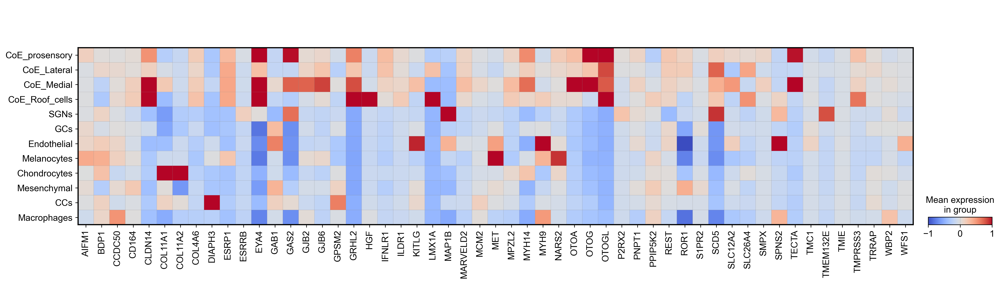

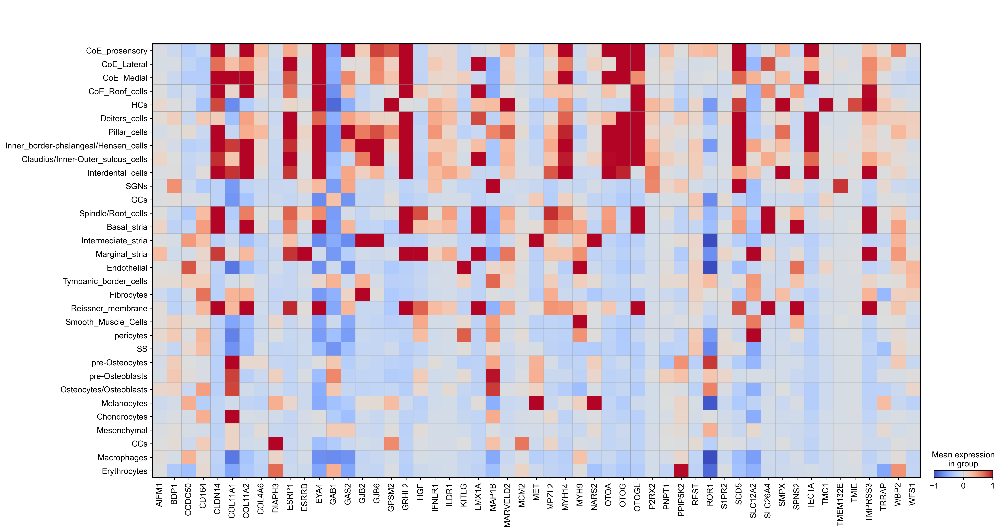

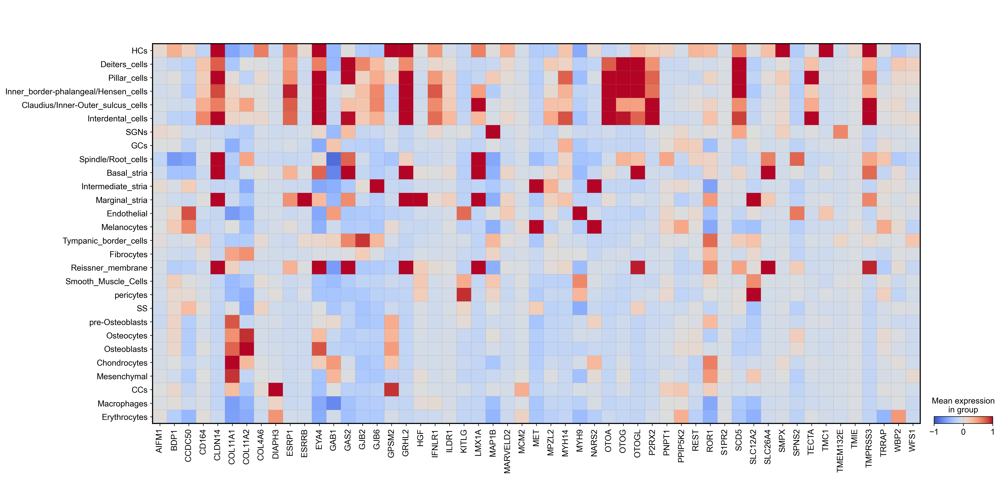

In [31]:
# Set figure parameters
sc.set_figure_params(figsize=(4,4), frameon=False, dpi=150, dpi_save=600)

# Create matrixplot with the subset and ordered categories
gs = sc.pl.matrixplot(
    adata_subset1, 
    markers2, 
    groupby='cell_type',
    layer="scaled",
    dendrogram=False,  # Disable dendrogram since we're using custom order
    vmin=-1,
    cmap="coolwarm",
    vmax=1,
    save="nonsyndromic_MULTIPLE_CELL_TYPES_adata1.pdf"
)
# Create matrixplot with the subset and ordered categories
gs = sc.pl.matrixplot(
    adata_subset2, 
    markers2, 
    groupby='cell_type',
    layer="scaled",
    dendrogram=False,  # Disable dendrogram since we're using custom order
    vmin=-1,
    cmap="coolwarm",
    vmax=1,
    save="nonsyndromic_MULTIPLE_CELL_TYPES_adata2.pdf"
)
# Create matrixplot with the subset and ordered categories
gs = sc.pl.matrixplot(
    adata_subset3, 
    markers2, 
    groupby='cell_type',
    layer="scaled",
    dendrogram=False,  # Disable dendrogram since we're using custom order
    vmin=-1,
    cmap="coolwarm",
    vmax=1,
    save="nonsyndromic_MULTIPLE_CELL_TYPES_adata3.pdf"
)

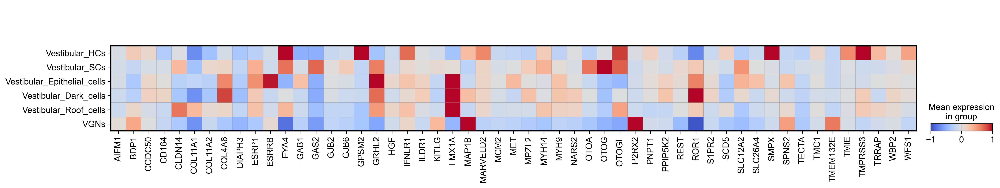

In [32]:
# Set figure parameters
sc.set_figure_params(figsize=(4,4), frameon=False, dpi=150, dpi_save=600)

# Create matrixplot with the subset and ordered categories
gs = sc.pl.matrixplot(
    adata_vestibu1, 
    markers2, 
    groupby='cell_type',
    layer="scaled",
    dendrogram=False,  # Disable dendrogram since we're using custom order
    vmin=-1,
    cmap="coolwarm",
    vmax=1,
    save="nonsyndromic_MULTIPLE_CELL_TYPES_adata1_vestibu.pdf"
)

In [33]:
#genes related nonsyndromic SNHL in SGN
markers3 = ['ACTG1','ADCY1','CIB2','CLDN9','CLIC5','DCDC2','DIAPH1','ELMOD3','GIPC3','LHFPL5',
            'LRTOMT','MSRB3','TJP2','TRIOBP'

          ]#'CEACAM16',

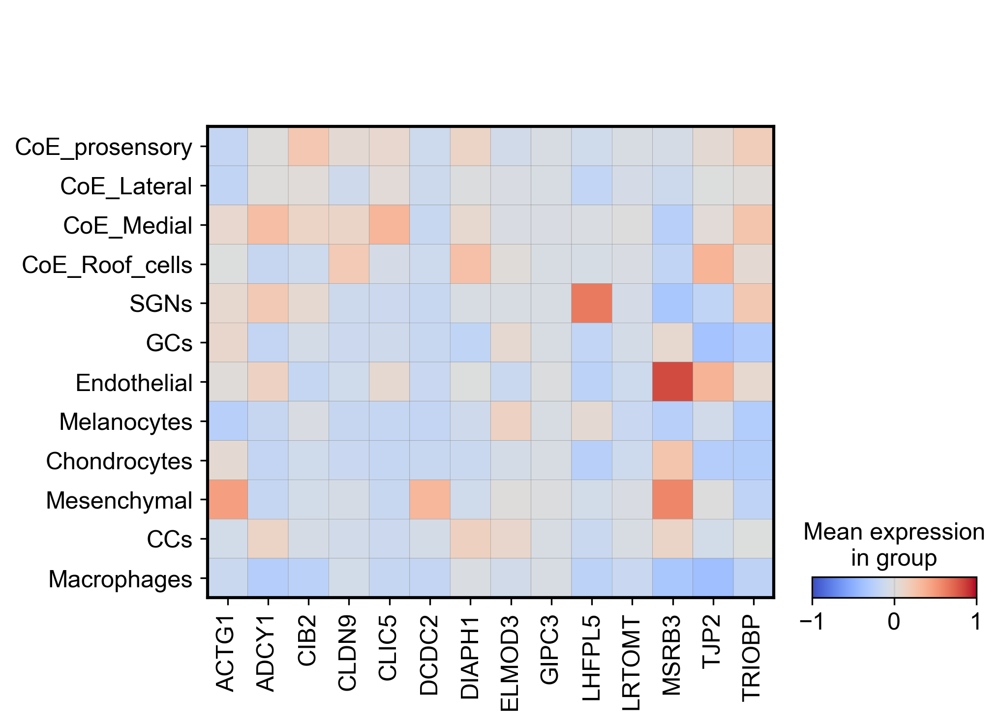

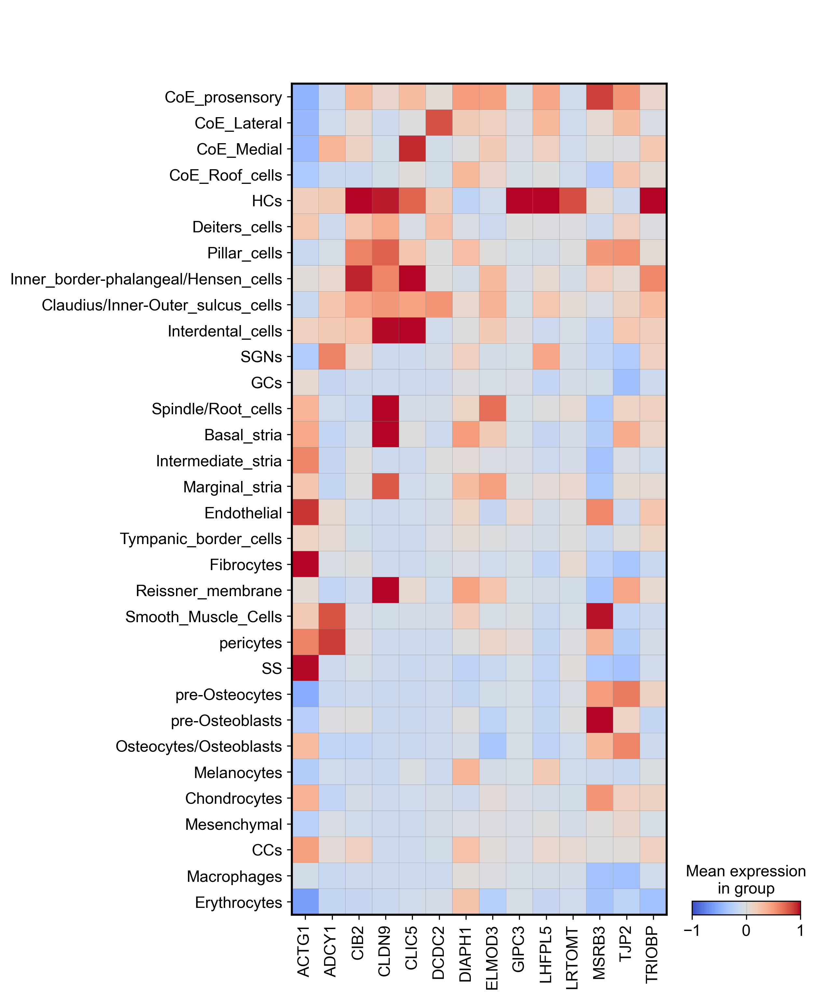

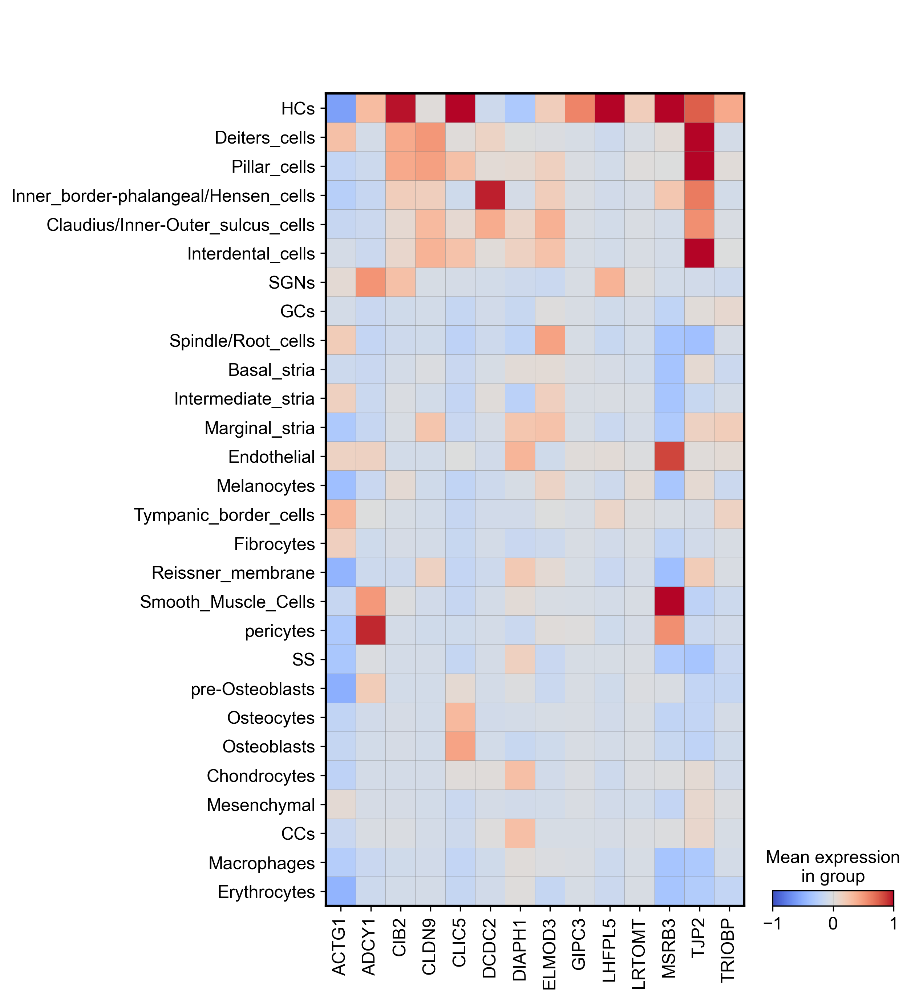

In [34]:
# Set figure parameters
sc.set_figure_params(figsize=(4,4), frameon=False, dpi=150, dpi_save=600)

# Create matrixplot with the subset and ordered categories
gs = sc.pl.matrixplot(
    adata_subset1, 
    markers3, 
    groupby='cell_type',
    layer="scaled",
    dendrogram=False,  # Disable dendrogram since we're using custom order
    vmin=-1,
    cmap="coolwarm",
    vmax=1,
    save="nonsyndromic_SGN_human_adata1.pdf"
)
# Create matrixplot with the subset and ordered categories
gs = sc.pl.matrixplot(
    adata_subset2, 
    markers3, 
    groupby='cell_type',
    layer="scaled",
    dendrogram=False,  # Disable dendrogram since we're using custom order
    vmin=-1,
    cmap="coolwarm",
    vmax=1,
    save="nonsyndromic_SGN_human_adata2.pdf"
)
# Create matrixplot with the subset and ordered categories
gs = sc.pl.matrixplot(
    adata_subset3, 
    markers3, 
    groupby='cell_type',
    layer="scaled",
    dendrogram=False,  # Disable dendrogram since we're using custom order
    vmin=-1,
    cmap="coolwarm",
    vmax=1,
    save="nonsyndromic_SGN_human_adata3.pdf"
)

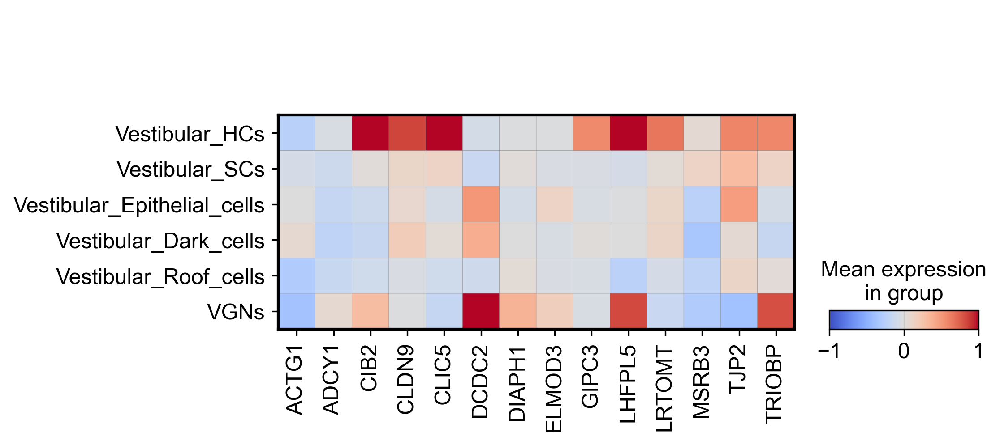

In [35]:
# Set figure parameters
sc.set_figure_params(figsize=(4,4), frameon=False, dpi=150, dpi_save=600)

# Create matrixplot with the subset and ordered categories
gs = sc.pl.matrixplot(
    adata_vestibu1, 
    markers3, 
    groupby='cell_type',
    layer="scaled",
    dendrogram=False,  # Disable dendrogram since we're using custom order
    vmin=-1,
    cmap="coolwarm",
    vmax=1,
    save="nonsyndromic_SGN_human_adata1_vestibu.pdf"
)

In [36]:
#genes related syndromic SNHL 
markers4 = ['GJB2',    'COL4A3','COL4A4','COL4A5','EYA1','SIX5','SIX1','SEMA3E','CHD7','KCNQ1','KCNE1','NDP','SLC26A4','KCNJ10',
            'HSD17B4','HARS2','CLPP','LARS2','TWNK','ERAL1','COL2A1','COL11A1','COL11A2','COL9A1','COL9A2','TCOF1',
            'POLR1D','POLR1C','MYO7A','USH1C','CDH23','PCDH15','USH2A','ADGRV1','WHRN','CLRN1','HARS'

          ]#'FOXI1'

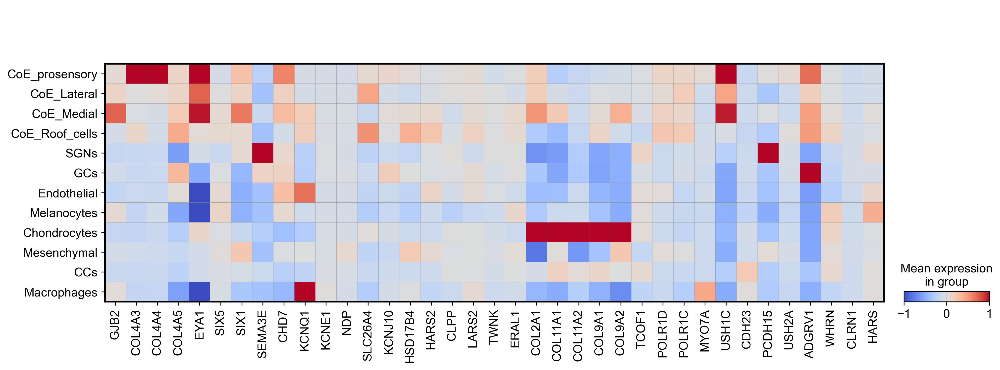

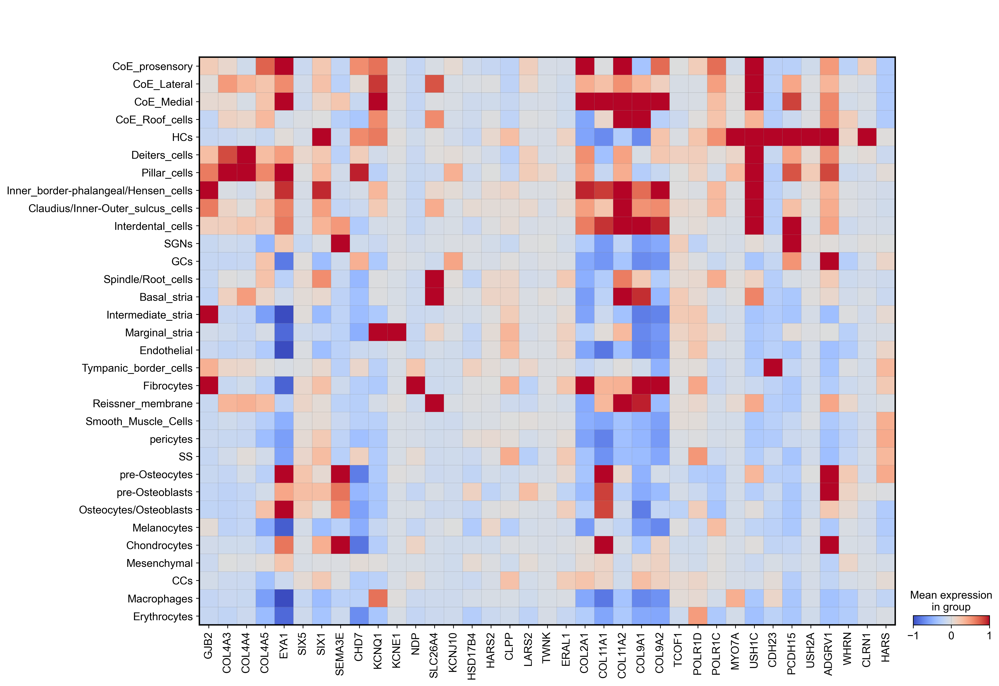

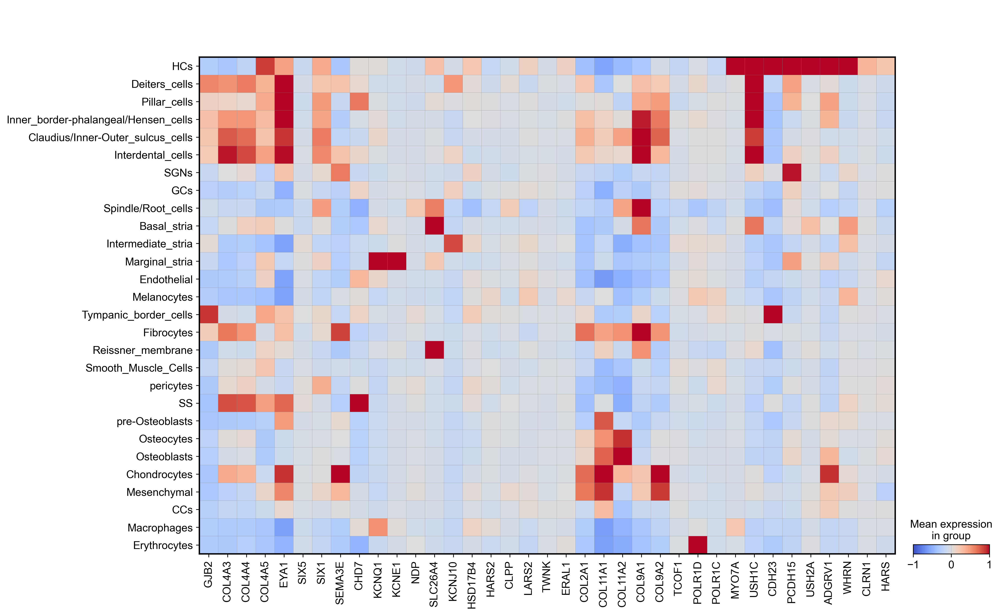

In [37]:
# Create matrixplot with the subset and ordered categories
# Set figure parameters
sc.set_figure_params(figsize=(4,4), frameon=False, dpi=150, dpi_save=600)
gs = sc.pl.matrixplot(
    adata_subset1, 
    markers4, 
    groupby='cell_type',
    layer="scaled",
    dendrogram=False,  # Disable dendrogram since we're using custom order
    vmin=-1,
    cmap="coolwarm",
    vmax=1,
    save="syndromic_human_adata1.pdf"
)
# Create matrixplot with the subset and ordered categories
gs = sc.pl.matrixplot(
    adata_subset2, 
    markers4, 
    groupby='cell_type',
    layer="scaled",
    dendrogram=False,  # Disable dendrogram since we're using custom order
    vmin=-1,
    cmap="coolwarm",
    vmax=1,
    save="syndromic_human_adata2.pdf"
)
# Create matrixplot with the subset and ordered categories
gs = sc.pl.matrixplot(
    adata_subset3, 
    markers4, 
    groupby='cell_type',
    layer="scaled",
    dendrogram=False,  # Disable dendrogram since we're using custom order
    vmin=-1,
    cmap="coolwarm",
    vmax=1,
    save="syndromic_human_adata3.pdf"
)

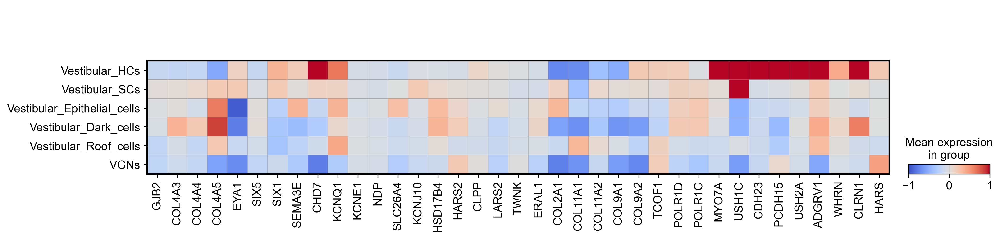

In [38]:
# Set figure parameters
sc.set_figure_params(figsize=(4,4), frameon=False, dpi=150, dpi_save=600)
gs = sc.pl.matrixplot(
    adata_vestibu1, 
    markers4, 
    groupby='cell_type',
    layer="scaled",
    dendrogram=False,  # Disable dendrogram since we're using custom order
    vmin=-1,
    cmap="coolwarm",
    vmax=1,
    save="nonsyndromic_SGN_human_adata1_vestibu.pdf"
)

In [39]:
adata_hu = sc.read(data_dir + '_human_cochlea_late_2nd_trimester.h5ad')

In [40]:
adata_mu = sc.read(data_dir + 'mouse_cochlea_P25_P28_scVI_with_rawounts.h5ad')

In [41]:
adata_pnas=sc.read("scRNA_P8P12P20.h5ad")

In [42]:
adata_hu.obs['cell_type'].value_counts()
adata_mu.obs['cell_type'].value_counts()
adata_pnas.obs['cell_type'].value_counts()

cell_type
Endothelial                             5025
Tympanic_border_cells                   5015
GCs                                     3823
Osteocytes                              3710
Intermediate_stria                      2881
Fibrocytes                              2794
Osteoblasts                             1760
Chondrocytes                            1538
Claudius/Inner-Outer_sulcus_cells       1167
Macrophages                              785
Mesenchymal                              694
pre-Osteoblasts                          660
SGNs                                     618
SS                                       595
Deiters_cells                            499
Marginal_stria                           484
CCs                                      473
Osteocytes/Osteoblasts                   391
Interdental_cells                        353
Inner_border-phalangeal/Hensen_cells     344
Pillar_cells                             266
Smooth_Muscle_Cells                      257


cell_type
Tympanic_border_cells                   2915
Claudius/Inner-Outer_sulcus_cells       2263
Inner_border-phalangeal/Hensen_cells    1663
Basal_stria                             1508
Reissner_membrane                       1331
Marginal_cells                          1151
OHCs                                    1091
Interdental_cells                        779
Intermediate_stria                       734
SGNs_1                                   721
Scala_vestibuli_border_cells             696
Dieters_cells/Pillar_cells               530
Spindle_cells                            380
Macrophages                              357
GCs                                      354
Fibrocytes                               330
IHCs                                     200
Root_cells                               171
Osteocytes/Osteoblasts                   109
Pericytes/Endothelial_cells               68
SS_1                                      57
SS_2                                      50


cell_type
B cells                                  13414
Erythrocytes                             12858
Intermediate stria                        9236
Tympanic border cells                     7698
Neutrophils                               6360
SS1                                       4701
Osteocytes                                4323
Macrophages                               4223
Schwann cells                             3464
Monocytes                                 2567
Fibrocytes                                1935
Glial cells                               1655
T cells                                   1518
Pre-osteoblasts                           1287
Inner border-phalangeal/ Hensen cells      988
Claudius/Inner-Outer sulcus cells          921
Scala vestibuli border cells               875
NK cells                                   841
SS2                                        746
Root cells                                 734
Marginal stria                             722
Ost

In [43]:
#remove un-consistency cell-types
exclude_clusters = ['CCs','Chondrocytes','Erythrocytes','Melanocytes','Mesenchymal','Smooth_Muscle_Cells','pre-Osteoblasts',
                   'Endothelial','pericytes','Basal_stria/Spindle/Root_cells']
adata_hu= adata_hu[~adata_hu.obs['cell_type'].isin(exclude_clusters), :]
adata_hu

View of AnnData object with n_obs × n_vars = 25999 × 39577
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'donor', 'gestation week (gw)', 'gender', '10xKit', 'sequencing', 'dataset', 'donor information', 'GSE ARCHIVE', 'percent_mito', 'n_counts', 'leiden_scanvi_1.2'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'Gene-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'Gene-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'Gene-2', 'n_cells_by_counts-2', 'mean_counts-2', 'pct_dropout_by_counts-2', 'total_counts-2', 'means-2', 'dispersions-2', 'dispersions_norm-2', 'n_cel

In [44]:
#remove un-consistency cell-types
exclude_clusters = ['Scala_vestibuli_border_cells','Pericytes/Endothelial_cells','Root_cells','Spindle_cells']
adata_mu= adata_mu[~adata_mu.obs['cell_type'].isin(exclude_clusters), :]
adata_mu

View of AnnData object with n_obs × n_vars = 16164 × 19593
    obs: 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'batch', 'sequecing', 'leiden', 'louvain', 'cell_type'
    var: 'gene_ids', 'feature_types', 'Gene', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'mean-0', 'std-0', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'mean-1', 'std-1', 'mean_counts-2', 'pct_dropout_by_counts-2', 'total_counts-2', 'means-2', 'dispersions-2', 'dispersions_norm-2', 'mean-2', 'std-2', 'mean_counts-3', 'pct_dropout_by_counts-3', 'total_counts-3', 'means-3', 'dispersions-3', 'dispersions_norm-3', 'mean-3', 'std-3', 'original_gene_symbol'
    uns: 'batch_colors', 'cell_type_colors', 'dendrogram_cell_type', 'hvg', 'leiden_scanvi_1.2', 'log1p', 'neighbors', 'pca', 'sequecing_colors', 'umap'
    obsm: 'X_pca', 'X_scVI', 'X_umap'
    layers

In [45]:
#remove un-consistency cell-types
exclude_clusters = ['B cells','Erythrocytes','Neutrophils','Monocytes','Glial cells','T cells','Pre-osteoblasts',
                   'Scala vestibuli border cells','NK cells','Endothelial cells','Glial precursor cells','Mast cells','Pericytes',
                   'Smooth muscle cells','Root cells','Spindle cells']
adata_pnas= adata_pnas[~adata_pnas.obs['cell_type'].isin(exclude_clusters), :]
adata_pnas

View of AnnData object with n_obs × n_vars = 44083 × 39970
    obs: 'cell_type', 'age', 'louvain'
    var: 'gene_symbol'

In [46]:
#rename
adata_hu.obs['cell_type'].value_counts()

cell_type
Tympanic_border_cells                   5015
GCs                                     3823
Osteocytes                              3710
Intermediate_stria                      2881
Fibrocytes                              2794
Osteoblasts                             1760
Claudius/Inner-Outer_sulcus_cells       1167
Macrophages                              785
SGNs                                     618
SS                                       595
Deiters_cells                            499
Marginal_stria                           484
Osteocytes/Osteoblasts                   391
Interdental_cells                        353
Inner_border-phalangeal/Hensen_cells     344
Pillar_cells                             266
Reissner_membrane                        245
Basal_stria                              230
HCs                                       39
Name: count, dtype: int64

In [77]:
cluster_annotation = {
 'Tympanic_border_cells': 'Tympanic_border_cells',
    'GCs': 'GCs',
    'Osteocytes': 'Osteocytes/Osteoblasts',
    'Intermediate_stria': 'Intermediate_stria',
    'Fibrocytes': 'Fibrocytes',
    'Osteoblasts': 'Osteocytes/Osteoblasts',
    'Claudius/Inner-Outer_sulcus_cells': 'Claudius/Inner-Outer_sulcus_cell',
    'Macrophages': 'Macrophages',
    'SGNs': 'SGNs',
    'SS': 'SS',
    'Deiters_cells': 'Deiters_cells/Pillar_cells',
    'Marginal_stria': 'Marginal_stria',
    'Osteocytes/Osteoblasts': 'Osteocytes/Osteoblasts',
    'Interdental_cells': 'Interdental_cells',
    'Inner_border-phalangeal/Hensen_cells': 'Inner_border-phalangeal/Hensen_cells',
    'Pillar_cells': 'Deiters_cells/Pillar_cells',
    'Reissner_membrane': 'Reissner_membrane',
    'Basal_stria': 'Basal_stria',
    'HCs': 'HCs',

}
adata_hu.obs['cell_type_disease'] = adata_hu.obs['cell_type'].map(cluster_annotation).astype('category')

In [48]:
adata_mu.obs['cell_type'].value_counts()

cell_type
Tympanic_border_cells                   2915
Claudius/Inner-Outer_sulcus_cells       2263
Inner_border-phalangeal/Hensen_cells    1663
Basal_stria                             1508
Reissner_membrane                       1331
Marginal_cells                          1151
OHCs                                    1091
Interdental_cells                        779
Intermediate_stria                       734
SGNs_1                                   721
Dieters_cells/Pillar_cells               530
Macrophages                              357
GCs                                      354
Fibrocytes                               330
IHCs                                     200
Osteocytes/Osteoblasts                   109
SS_1                                      57
SS_2                                      50
SGNs_2                                    21
Name: count, dtype: int64

In [78]:
cluster_annotation = {
 'Tympanic_border_cells': 'Tympanic_border_cells',
    'GCs': 'GCs',
    'Intermediate_stria': 'Intermediate_stria',
    'Fibrocytes': 'Fibrocytes',
    'Claudius/Inner-Outer_sulcus_cells': 'Claudius/Inner-Outer_sulcus_cell',
    'Macrophages': 'Macrophages',
    'Marginal_cells': 'Marginal_stria',
    'Osteocytes/Osteoblasts': 'Osteocytes/Osteoblasts',
    'Interdental_cells': 'Interdental_cells',
    'Inner_border-phalangeal/Hensen_cells': 'Inner_border-phalangeal/Hensen_cells',
    'Reissner_membrane': 'Reissner_membrane',
    'Basal_stria': 'Basal_stria',
    'OHCs': 'HCs',
     'IHCs': 'HCs',
    'Dieters_cells/Pillar_cells': 'Deiters_cells/Pillar_cells',
    'SS_1': 'SS',
     'SS_2': 'SS',
     'SGNs_1': 'SGNs',
     'SGNs_2': 'SGNs',
}
adata_mu.obs['cell_type_disease'] = adata_mu.obs['cell_type'].map(cluster_annotation).astype('category')

In [50]:
adata_pnas.obs['cell_type'].value_counts()

cell_type
Intermediate stria                       9236
Tympanic border cells                    7698
SS1                                      4701
Osteocytes                               4323
Macrophages                              4223
Schwann cells                            3464
Fibrocytes                               1935
Inner border-phalangeal/ Hensen cells     988
Claudius/Inner-Outer sulcus cells         921
SS2                                       746
Marginal stria                            722
Osteoblasts                               701
Deiter's cells                            647
Inner hair cells                          247
Pillar cells                              204
Reissner membrane                         203
Type I Neurons                            132
Interdental cells                          87
Basal stria                                47
Type II Neurons                            19
Name: count, dtype: int64

In [82]:
cluster_annotation = {
    'Tympanic border cells': 'Tympanic_border_cells',
    'Schwann cells': 'GCs',
    'Intermediate stria': 'Intermediate_stria',
    'Fibrocytes': 'Fibrocytes',
    'Claudius/Inner-Outer sulcus cells': 'Claudius/Inner-Outer_sulcus_cell',
    'Macrophages': 'Macrophages',
    'Marginal stria': 'Marginal_stria',
    'Osteocytes': 'Osteocytes/Osteoblasts',
    'Osteoblasts': 'Osteocytes/Osteoblasts',
    'Interdental cells': 'Interdental_cells',
    'Inner border-phalangeal/ Hensen cells': 'Inner_border-phalangeal/Hensen_cells',
    'Reissner membrane': 'Reissner_membrane',
    'Basal stria': 'Basal_stria',
    'Inner hair cells': 'HCs',
    "Deiter's cells": 'Deiters_cells/Pillar_cells',
    'Pillar cells': 'Deiters_cells/Pillar_cells',
    'SS1': 'SS',
    'SS2': 'SS',
    'Type I Neurons': 'SGNs',
    'Type II Neurons': 'SGNs',
}

adata_pnas.obs['cell_type_disease'] = adata_pnas.obs['cell_type'].map(cluster_annotation).astype('category')

In [52]:
adata_hu.layers["scaled"]=sc.pp.scale(adata_hu.X,max_value=5,copy=True)
adata_mu.layers["scaled"]=sc.pp.scale(adata_mu.X,max_value=5,copy=True)
adata_pnas.layers["scaled"]=sc.pp.scale(adata_pnas.X,max_value=5,copy=True)

In [80]:
#genes related autosomal nonsyndromic hearing loss
markers5 = ['DIAPH1', 'KCNQ4', 'IFNLR1', 'GJB2', 'GJB6', 'MYH14',"CEACAM16",'WFS1','LMX1A','TECTA','COCH','EYA4','MYO7A','COL11A2','POU4F3',
          'MYH9','ACTG1','MYO6','SIX1','SLC17A8','REST','GRHL2','NLRP3','TMC1','COL11A1','CRYM','P2RX2','CCDC50','TJP2','TNC','TBC1D24',
'CD164','OSBPL2','HOMER2','KITLG','MCM2','PTPRQ','DMXL2','MYO3A','PDE1C','TRRAP','PLS1','ATP2B2','SLC12A2','MAP1B',

          ]#'SCD5',

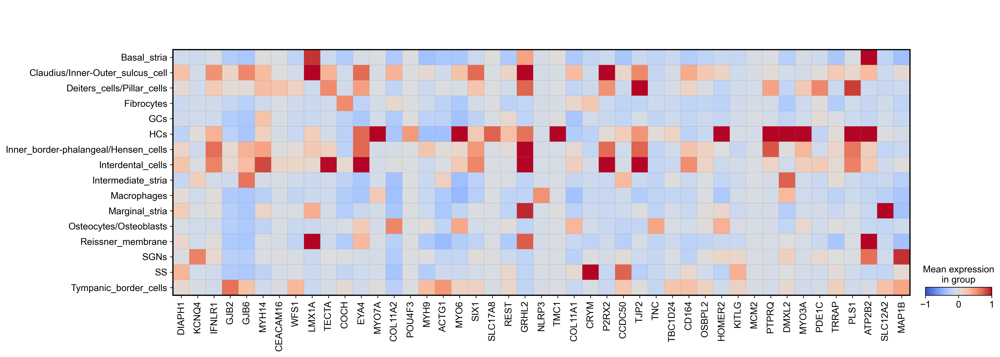

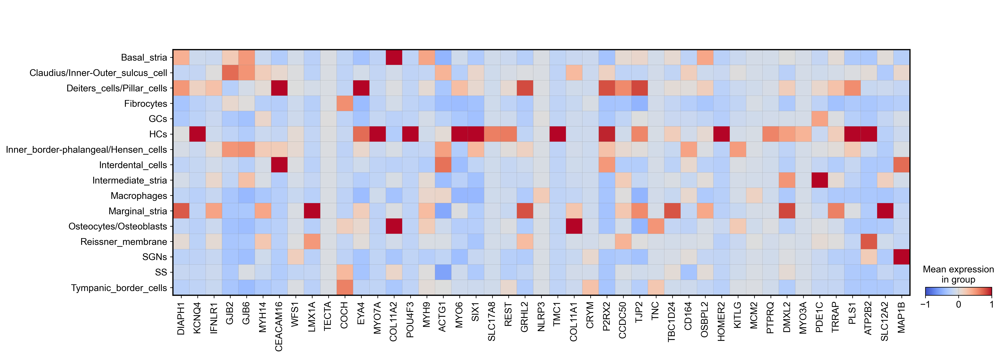

In [81]:
# Create matrixplot with the subset and ordered categories
# Set figure parameters
sc.set_figure_params(figsize=(4,4), frameon=False, dpi=150, dpi_save=600)
gs = sc.pl.matrixplot(
    adata_hu, 
    markers5, 
    groupby='cell_type_disease',
    layer="scaled",
    dendrogram=False,  # Disable dendrogram since we're using custom order
    vmin=-1,
    cmap="coolwarm",
    vmax=1,
    save="autosomal_nonsyndromic_human.pdf"
)
# Create matrixplot with the subset and ordered categories
gs = sc.pl.matrixplot(
    adata_mu, 
    markers5, 
    groupby='cell_type_disease',
    layer="scaled",
    dendrogram=False,  # Disable dendrogram since we're using custom order
    vmin=-1,
    cmap="coolwarm",
    vmax=1,
    save="autosomal_nonsyndromic_mouse.pdf"
)


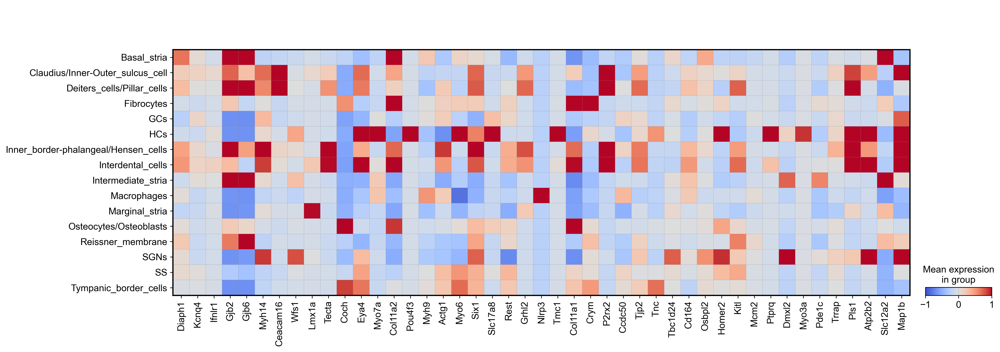

In [83]:
sc.set_figure_params(figsize=(4,4), frameon=False, dpi=150, dpi_save=600)
markers_5 = ['Diaph1', 'Kcnq4', 'Ifnlr1', 'Gjb2', 'Gjb6', 'Myh14',"Ceacam16",'Wfs1','Lmx1a','Tecta','Coch','Eya4','Myo7a','Col11a2','Pou4f3',
          'Myh9','Actg1','Myo6','Six1','Slc17a8','Rest','Grhl2','Nlrp3','Tmc1','Col11a1','Crym','P2rx2','Ccdc50','Tjp2','Tnc','Tbc1d24',
'Cd164','Osbpl2','Homer2','Kitl','Mcm2','Ptprq','Dmxl2','Myo3a','Pde1c','Trrap','Pls1','Atp2b2','Slc12a2','Map1b',

          ]#'Scd5'
# Create matrixplot with the subset and ordered categories
gs = sc.pl.matrixplot(
    adata_pnas, 
    markers_5, 
    groupby='cell_type_disease',
    layer="scaled",
    #gene_symbols='gene_symbol',
    dendrogram=False,  # Disable dendrogram since we're using custom order
    vmin=-1,
    cmap="coolwarm",
    vmax=1,
    gene_symbols='gene_symbol',
    save="autosomal_nonsyndromic_pnas.pdf"
)

In [84]:
#genes related autosomal recessive nonsyndromic hearing loss
markers_6 = ['GJB2',
'MYO7A','SLC26A4','TMIE','TMC1','TMPRSS3','OTOF','CDH23',
'GIPC3','USH1C','OTOG','TECTA','OTOA',
'PCDH15','RDX','GRXCR1','GAB1','TRIOBP','CLDN14','MYO3A','ESRRB','MYO6','HGF','ADCY1','CIB2','MARVELD2','BDP1',
'COL11A2','PDZD7','SLC22A4','SLC26A5','DCDC2','LHFPL5',
'S1PR2','PNPT1','BSND','MSRB3','SYNE4','LOXHD1','TPRN','PTPRQ','OTOGL','TBC1D24','CABP2',
           'NARS2','MET','TMEM132E','PPIP5K2','GRXCR2','EPS8',
'CLIC5','EPS8L2','ROR1','WBP2','ESRP1','MPZL2','CEACAM16','SPNS2','CLDN9','CLRN2','GAS2',
           'ELMOD3','ESPN','PJVK','STRC','TSPEAR','WHRN'
          ]#'FAM65B','LDR1','GRAP', 'KARS', 'LRTOMT''MYO15A','SERPINB6',

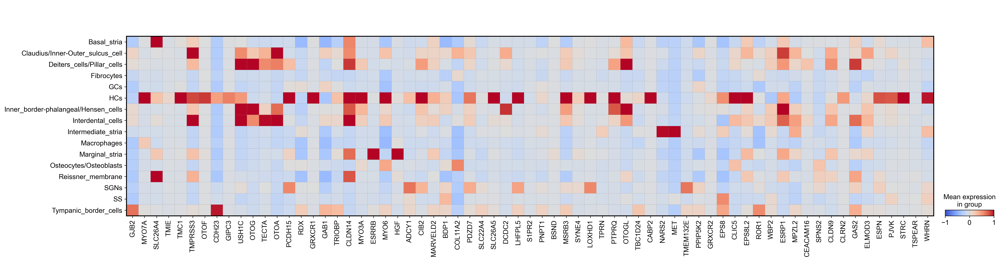

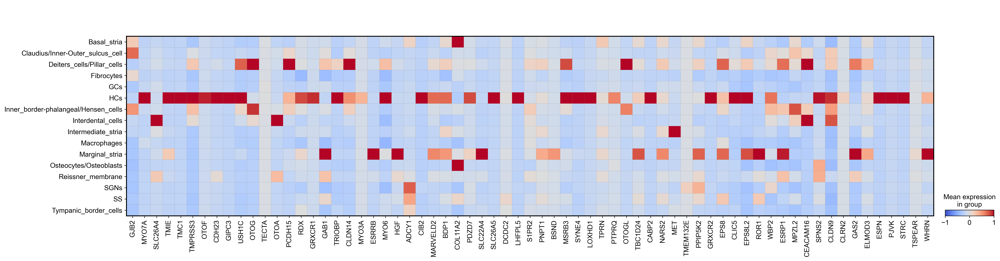

In [85]:
# Create matrixplot with the subset and ordered categories
# Set figure parameters
sc.set_figure_params(figsize=(4,4), frameon=False, dpi=150, dpi_save=600)
gs = sc.pl.matrixplot(
    adata_hu, 
    markers_6, 
    groupby='cell_type_disease',
    layer="scaled",
    dendrogram=False,  # Disable dendrogram since we're using custom order
    vmin=-1,
    cmap="coolwarm",
    vmax=1,
    save="autosomal_ recessive_human.pdf"
)
# Create matrixplot with the subset and ordered categories
gs = sc.pl.matrixplot(
    adata_mu, 
    markers_6, 
    groupby='cell_type_disease',
    layer="scaled",
    dendrogram=False,  # Disable dendrogram since we're using custom order
    vmin=-1,
    cmap="coolwarm",
    vmax=1,
    save="autosomal_ recessivec_mouse.pdf"
)


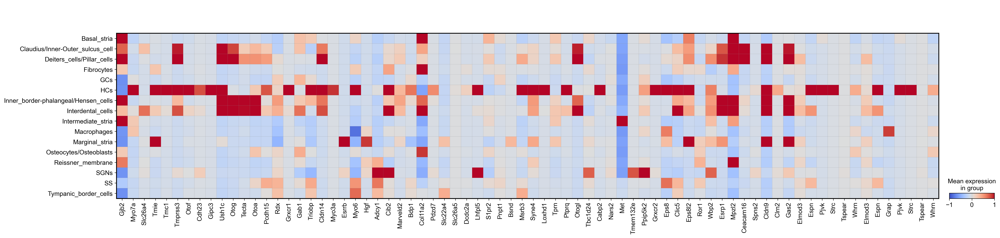

In [86]:
sc.set_figure_params(figsize=(4,4), frameon=False, dpi=150, dpi_save=600)
markers_6 = ['Gjb2',
'Myo7a','Slc26a4','Tmie','Tmc1','Tmprss3','Otof','Cdh23',
'Gipc3','Ush1c','Otog','Tecta','Otoa',
'Pcdh15','Rdx','Grxcr1','Gab1','Triobp','Cldn14','Myo3a','Esrrb','Myo6','Hgf','Adcy1','Cib2','Marveld2','Bdp1',
'Col11a2','Pdzd7','Slc22a4','Slc26a5','Dcdc2a','Lhfpl5',
'S1pr2','Pnpt1','Bsnd','Msrb3','Syne4','Loxhd1','Tprn','Ptprq','Otogl','Tbc1d24','Cabp2',
           'Nars2','Met','Tmem132e','Ppip5k2','Grxcr2','Eps8',
'Clic5','Eps8l2','Ror1','Wbp2','Esrp1','Mpzl2','Ceacam16','Spns2','Cldn9','Clrn2','Gas2',
           'Elmod3','Espn','Pjvk','Strc','Tspear','Whrn','Elmod3','Espn','Grap','Pjvk','Strc','Tspear','Whrn',
          ]#'FAM65B','LDR1','GRAP', 'KARS', 'LRTOMT''Myo15',
# Create matrixplot with the subset and ordered categories
gs = sc.pl.matrixplot(
    adata_pnas, 
    markers_6, 
    groupby='cell_type_disease',
    layer="scaled",
    #gene_symbols='gene_symbol',
    dendrogram=False,  # Disable dendrogram since we're using custom order
    vmin=-1,
    cmap="coolwarm",
    vmax=1,
    gene_symbols='gene_symbol',
    save="autosomal_ recessivec_pnas.pdf"
)

In [87]:
#genes related x-linked nonsyndromic age_related cisplatin_related hearing loss
markers_7 = ['PRPS1','POU3F4','SMPX','AIFM1','COL4A6','DIAPH3','ACVR1B','CCBE1','CNTNAP2','EIF4ENIF1','ISG20','NCALD',
'PRR14L','SFI1','SV2B','ZNF691','GRM8','IQGAP2','DCLK1','CDH13','PTPRD','CMIP',
'ESRRG','SIK3','PCDH20','SLC28A3','TRIOBP','ILDR1','EYA4','CEP104','SLC44A2','STRN','ARHGAP35',
'FAT2','LPP','NHSL1','OSBPL5','POU6F1','PDSS1','SCARA5','SH2D4B','VAV3','GRM7','ST6GALNAC5'
          ]#'METTL13','FAM167A'

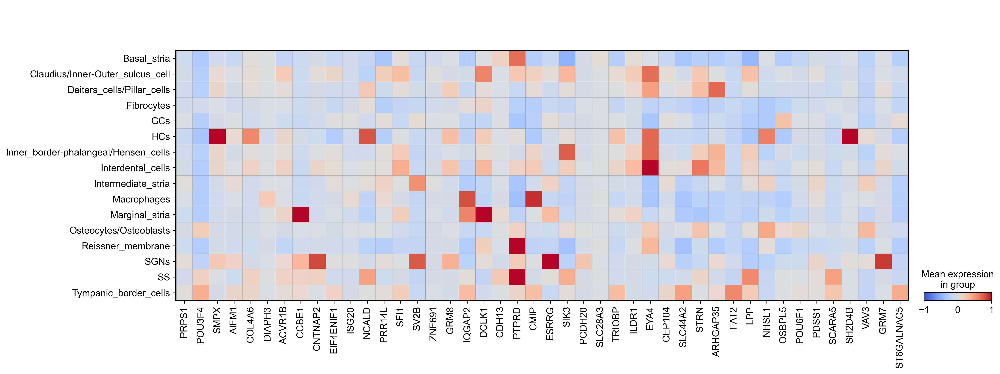

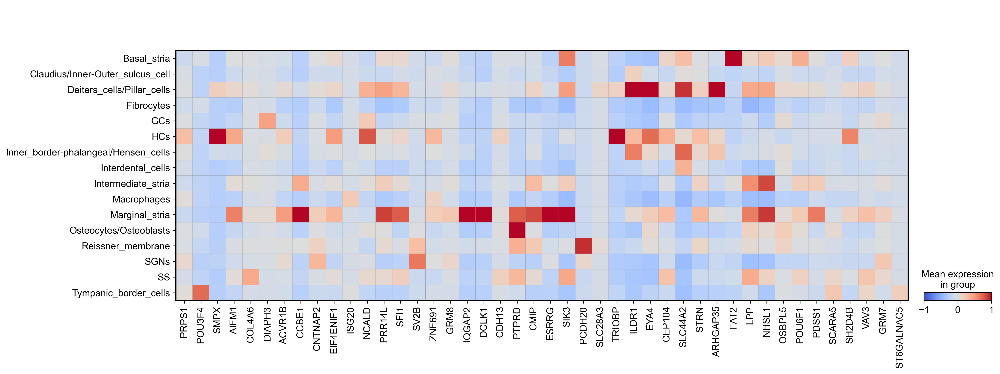

In [88]:
# Create matrixplot with the subset and ordered categories
# Set figure parameters
sc.set_figure_params(figsize=(4,4), frameon=False, dpi=150, dpi_save=600)
gs = sc.pl.matrixplot(
    adata_hu, 
    markers_7, 
    groupby='cell_type_disease',
    layer="scaled",
    dendrogram=False,  # Disable dendrogram since we're using custom order
    vmin=-1,
    cmap="coolwarm",
    vmax=1,
    save="x_link_age_cisplatin_ recessive_human.pdf"
)
# Create matrixplot with the subset and ordered categories
gs = sc.pl.matrixplot(
    adata_mu, 
    markers_7, 
    groupby='cell_type_disease',
    layer="scaled",
    dendrogram=False,  # Disable dendrogram since we're using custom order
    vmin=-1,
    cmap="coolwarm",
    vmax=1,
    save="x_link_age_cisplatin_ recessive_mouse.pdf"
)

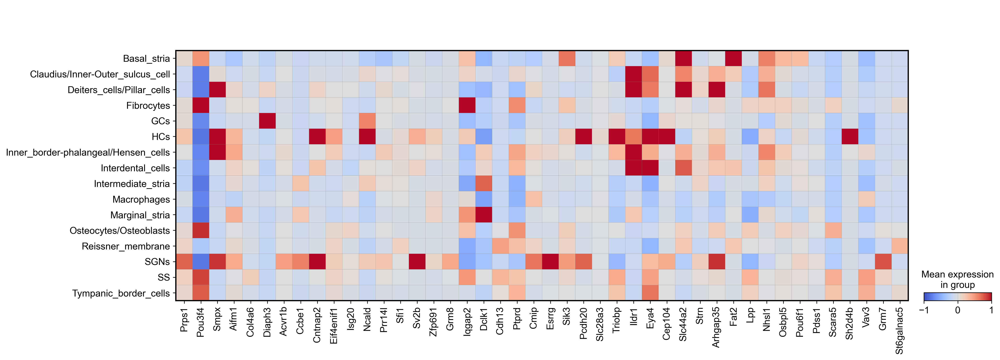

In [89]:
#genes related x-linked nonsyndromic age_related cisplatin_related hearing loss
markers_7 = ['Prps1','Pou3f4','Smpx','Aifm1','Col4a6','Diaph3','Acvr1b','Ccbe1','Cntnap2','Eif4enif1','Isg20','Ncald',
'Prr14l','Sfi1','Sv2b','Zfp691','Grm8','Iqgap2','Dclk1','Cdh13','Ptprd','Cmip',
'Esrrg','Sik3','Pcdh20','Slc28a3','Triobp','Ildr1','Eya4','Cep104','Slc44a2','Strn','Arhgap35',
'Fat2','Lpp','Nhsl1','Osbpl5','Pou6f1','Pdss1','Scara5','Sh2d4b','Vav3','Grm7','St6galnac5'
 ]#,#'METTL13','FAM167A'
# Create matrixplot with the subset and ordered categories
gs = sc.pl.matrixplot(
    adata_pnas, 
    markers_7, 
    groupby='cell_type_disease',
    layer="scaled",
    #gene_symbols='gene_symbol',
    dendrogram=False,  # Disable dendrogram since we're using custom order
    vmin=-1,
    cmap="coolwarm",
    vmax=1,
    gene_symbols='gene_symbol',
    save="x_link_age_cisplatin_ recessive_pnas.pdf"
)

In [90]:
#genes related syndromic hearing loss
markers_8 = [
'COL4A3','COL4A4','COL4A5','EYA1','SIX5','SIX1','SEMA3E','CHD7','KCNE1',
'NDP','SLC26A4','KCNJ10','HSD17B4','CLPP','LARS2','ERAL1','COL2A1','COL11A1','COL11A2',
'COL9A1','COL9A2','TCOF1','POLR1D','POLR1C','MYO7A','USH1C','CDH23','PCDH15','USH1G',
'USH2A','CLRN1','PAX3','MITF','SNAI2','SOX10','PAX3','EDN3','SOX10','EDNRB','TWNK','WHRN'

          ]#

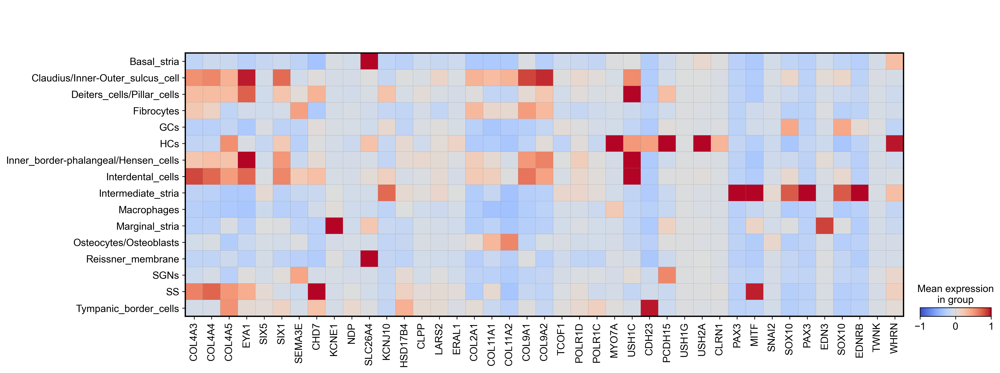

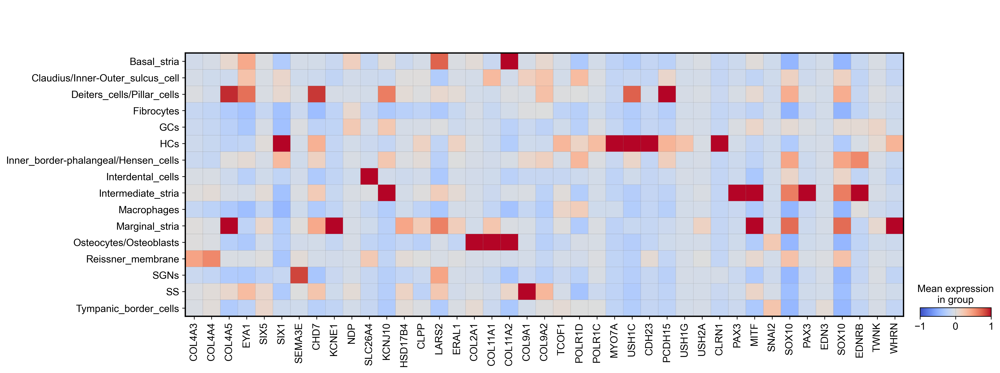

In [91]:
# Create matrixplot with the subset and ordered categories
# Set figure parameters
sc.set_figure_params(figsize=(4,4), frameon=False, dpi=150, dpi_save=600)
gs = sc.pl.matrixplot(
    adata_hu, 
    markers_8, 
    groupby='cell_type_disease',
    layer="scaled",
    dendrogram=False,  # Disable dendrogram since we're using custom order
    vmin=-1,
    cmap="coolwarm",
    vmax=1,
    save="syndromic_human.pdf"
)
# Create matrixplot with the subset and ordered categories
gs = sc.pl.matrixplot(
    adata_mu, 
    markers_8, 
    groupby='cell_type_disease',
    layer="scaled",
    dendrogram=False,  # Disable dendrogram since we're using custom order
    vmin=-1,
    cmap="coolwarm",
    vmax=1,
    save="syndromic_mouse.pdf"
)

In [92]:
#genes related syndromic hearing loss
markers_8 = [
'Col4a3','Col4a4', 'Col4a5',    'Eya1','Six5','Six1','Sema3e','Chd7','Kcne1',
'Ndp','Slc26a4','Kcnj10','Hsd17b4','Clpp','Lars2','Eral1','Col2a1','Col11a1','Col11a2',
'Col9a1','Col9a2','Tcof1','Polr1d','Polr1c','Myo7a','Ush1c','Cdh23','Pcdh15','Ush1g',
'Ush2a','Clrn1','Pax3','Mitf','Snai2','Sox10','Edn3','Sox10','Ednrb','Twnk','Whrn',

          ]#

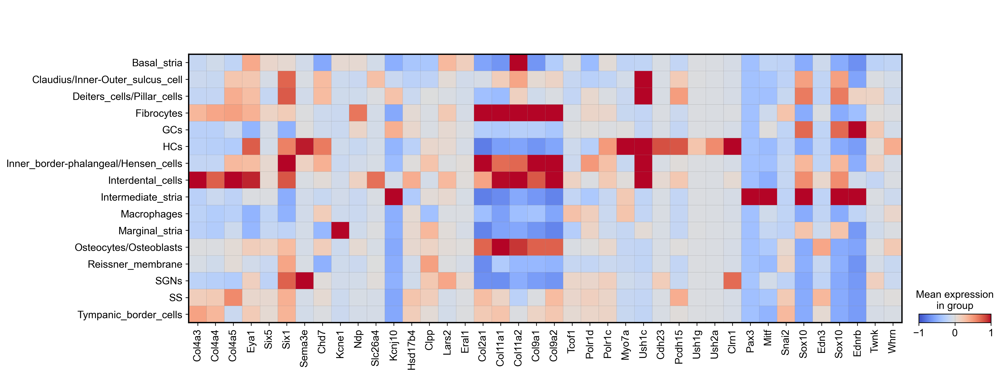

In [94]:
sc.set_figure_params(figsize=(4,4), frameon=False, dpi=150, dpi_save=600)
gs = sc.pl.matrixplot(
    adata_pnas, 
    markers_8, 
    groupby='cell_type_disease',
    layer="scaled",
    dendrogram=False,  # Disable dendrogram since we're using custom order
    vmin=-1,
    cmap="coolwarm",
    gene_symbols='gene_symbol',
    vmax=1,
    save="syndromic_pnas.pdf"
)